# Sun Energy Optimization: Exploratory Data Analysis (EDA)

## Dataset Overview

## Solar Radiation Measurement Data for Benin

This dataset is sourced and compiled from EnergyData.info. Each record includes values for solar radiation, air temperature, relative humidity, barometric pressure, precipitation, wind speed, wind direction, radiance sensor data (clean and soiled), soiling measurements, and cleaning events.

### Imports and Reading Data

In [56]:
# Import Essentials Library
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

In [57]:
benin_df = pd.read_csv('../data/benin-malanville.csv')

### Data Understanding

In [58]:
benin_df.head(15)

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-08-09 00:01,-1.2,-0.2,-1.1,0.0,0.0,26.2,93.4,0.0,0.4,0.1,122.1,0.0,998,0,0.0,26.3,26.2,NaN
1,2021-08-09 00:02,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.6,0.0,0.0,0.0,0.0,0.0,998,0,0.0,26.3,26.2,NaN
2,2021-08-09 00:03,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.7,0.3,1.1,0.5,124.6,1.5,997,0,0.0,26.4,26.2,NaN
3,2021-08-09 00:04,-1.1,-0.1,-1.0,0.0,0.0,26.2,93.3,0.2,0.7,0.4,120.3,1.3,997,0,0.0,26.4,26.3,NaN
4,2021-08-09 00:05,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.3,0.1,0.7,0.3,113.2,1.0,997,0,0.0,26.4,26.3,NaN
5,2021-08-09 00:06,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.8,0.0,0.4,0.1,119.1,0.0,997,0,0.0,26.4,26.3,NaN
6,2021-08-09 00:07,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.7,0.0,0.0,0.0,0.0,0.0,997,0,0.0,26.5,26.3,NaN
7,2021-08-09 00:08,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.7,0.7,1.3,0.6,126.8,2.8,997,0,0.0,26.5,26.3,NaN
8,2021-08-09 00:09,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.6,0.4,1.1,0.5,124.9,5.5,997,0,0.0,26.5,26.4,NaN
9,2021-08-09 00:10,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.6,0.5,1.1,0.5,114.2,5.1,997,0,0.0,26.5,26.4,NaN


In [59]:
benin_df.tail(15)

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
525585,2022-08-08 23:46,-5.4,-0.1,-5.7,0.0,0.0,23.1,98.3,0.1,0.7,0.3,100.8,0.2,996,0,0.0,23.4,22.8,NaN
525586,2022-08-08 23:47,-5.4,-0.1,-5.7,0.0,0.0,23.1,98.3,0.1,0.7,0.2,99.1,0.1,996,0,0.0,23.4,22.8,NaN
525587,2022-08-08 23:48,-5.4,-0.1,-5.7,0.0,0.0,23.1,98.3,0.1,0.7,0.4,101.1,0.5,996,0,0.0,23.4,22.8,NaN
525588,2022-08-08 23:49,-5.4,-0.1,-5.7,0.0,0.0,23.1,98.3,0.3,1.1,0.5,100.4,2.0,996,0,0.0,23.4,22.8,NaN
525589,2022-08-08 23:50,-5.5,-0.1,-5.8,0.0,0.0,23.1,98.3,0.4,1.3,0.5,102.7,3.3,996,0,0.0,23.4,22.8,NaN
525590,2022-08-08 23:51,-5.5,-0.1,-5.8,0.0,0.0,23.1,98.3,0.6,1.3,0.6,95.9,6.2,996,0,0.0,23.4,22.8,NaN
525591,2022-08-08 23:52,-5.5,0.0,-5.8,0.0,0.0,23.1,98.3,0.4,1.1,0.5,94.0,2.5,996,0,0.0,23.4,22.8,NaN
525592,2022-08-08 23:53,-5.5,-0.1,-5.8,0.0,0.0,23.1,98.4,0.3,1.1,0.5,103.5,1.9,996,0,0.0,23.5,22.9,NaN
525593,2022-08-08 23:54,-5.5,-0.1,-5.9,0.0,0.0,23.1,98.4,0.1,1.1,0.3,94.3,1.5,996,0,0.0,23.5,22.9,NaN
525594,2022-08-08 23:55,-5.5,-0.1,-5.9,0.0,0.0,23.1,98.3,0.1,1.1,0.3,112.2,0.7,996,0,0.0,23.5,22.9,NaN


In [60]:
(benin_df[["Cleaning"]] > 0).sum()

Cleaning    485
dtype: int64

In [61]:
# Shape or size of the datasets
print(f'Benin Dataset Shape: {benin_df.shape}')

Benin Dataset Shape: (525600, 19)


In [62]:
benin_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB          525600 non-nul

### Data Insights for Benin data

Most columns are fully populated (525,600 non-null).
The Comments column is completely empty (0 non-null), indicating it might be redundant and could be dropped unless relevant.

In [63]:
# To drop the comments column for all the datasets
benin_df.drop('Comments', axis=1, inplace=True)

In [64]:
# Statistics of benin datasets
benin_df.describe()

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000
mean,240.559452,167.187516,115.358961,236.589496,228.883576,28.179683,54.487969,2.121113,2.809195,0.473390,153.435172,8.582407,994.197199,0.000923,0.001905,35.246026,32.471736
std,331.131327,261.710501,158.691074,326.894859,316.536515,5.924297,28.073069,1.603466,2.029120,0.273395,102.332842,6.385864,2.474993,0.030363,0.037115,14.807258,12.348743
min,-12.900000,-7.800000,-12.600000,0.000000,0.000000,11.000000,2.100000,0.000000,0.000000,0.000000,0.000000,0.000000,985.000000,0.000000,0.000000,9.000000,8.100000
25%,-2.000000,-0.500000,-2.100000,0.000000,0.000000,24.200000,28.800000,1.000000,1.300000,0.400000,59.000000,3.700000,993.000000,0.000000,0.000000,24.200000,23.600000
50%,1.800000,-0.100000,1.600000,4.500000,4.300000,28.000000,55.100000,1.900000,2.600000,0.500000,181.000000,8.600000,994.000000,0.000000,0.000000,30.000000,28.900000
75%,483.400000,314.200000,216.300000,463.700000,447.900000,32.300000,80.100000,3.100000,4.100000,0.600000,235.100000,12.300000,996.000000,0.000000,0.000000,46.900000,41.500000
max,1413.000000,952.300000,759.200000,1342.300000,1342.300000,43.800000,100.000000,19.500000,26.600000,4.200000,360.000000,99.400000,1003.000000,1.000000,2.500000,81.000000,72.500000


### Data Redunduncy

In [65]:
duplicated_columns = benin_df.columns[benin_df.columns.duplicated()]
if len(duplicated_columns) > 0:
    print("Duplicated columns:", duplicated_columns)
else:
    print("No duplicated columns found for benin datasets.")

No duplicated columns found for benin datasets.


In [66]:
duplicated_rows = benin_df[benin_df.duplicated()]
if not duplicated_rows.empty:
    print("Duplicated rows:")
    print(duplicated_rows)
else:
    print("No duplicated rows found for Benin datasets.")

No duplicated rows found for Benin datasets.


### Feature Understanding

In [67]:
# Exploring Unique values
benin_df.nunique()

Timestamp        525600
GHI                8609
DNI                8905
DHI                6995
ModA              10755
ModB               8461
Tamb                329
RH                  980
WS                  164
WSgust               92
WSstdev              42
WD                 3601
WDstdev             679
BP                   19
Cleaning              2
Precipitation        26
TModA               712
TModB               642
dtype: int64

### Correlation Heat Map for the Benien Data set

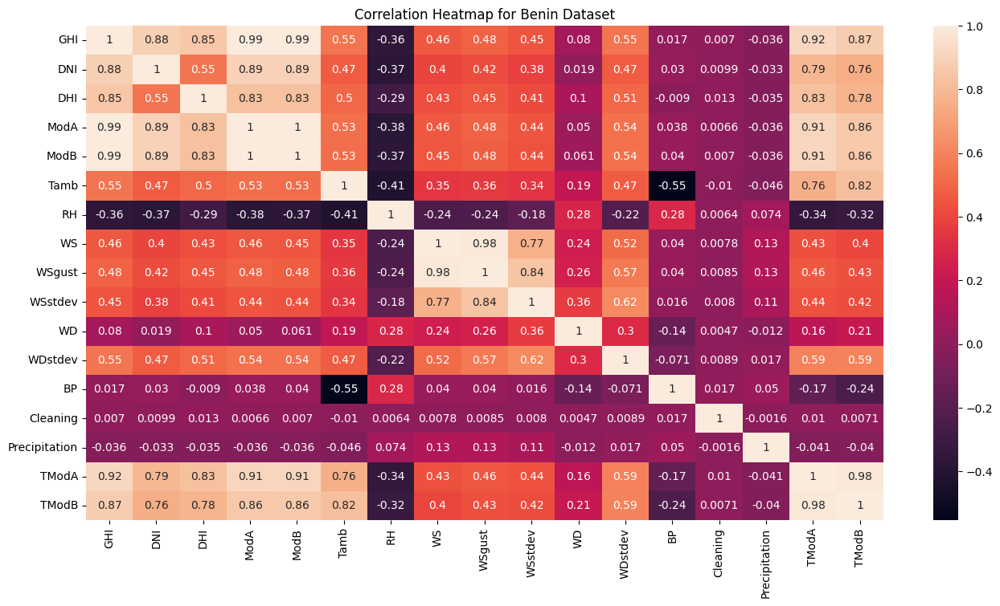

In [68]:
# Visuallizing correlation with heatmaps

# Select only numeric columns for correlation calculation
numeric_benin_df = benin_df.select_dtypes(include=['float64', 'int64'])
plt.figure(figsize=(16, 8))
sns.heatmap(numeric_benin_df.corr(), annot=True)
plt.title('Correlation Heatmap for Benin Dataset')
plt.show()

The correlation coefficient, ranging from -1 to 1, measures the strength and direction of the relationship between two features in our dataset. A value near 1 (positive) signifies a strong positive relationship, a value near -1 indicates a strong negative relationship, and a value close to 0 suggests no significant relationship.

### Identifying Outliers with Box Plots

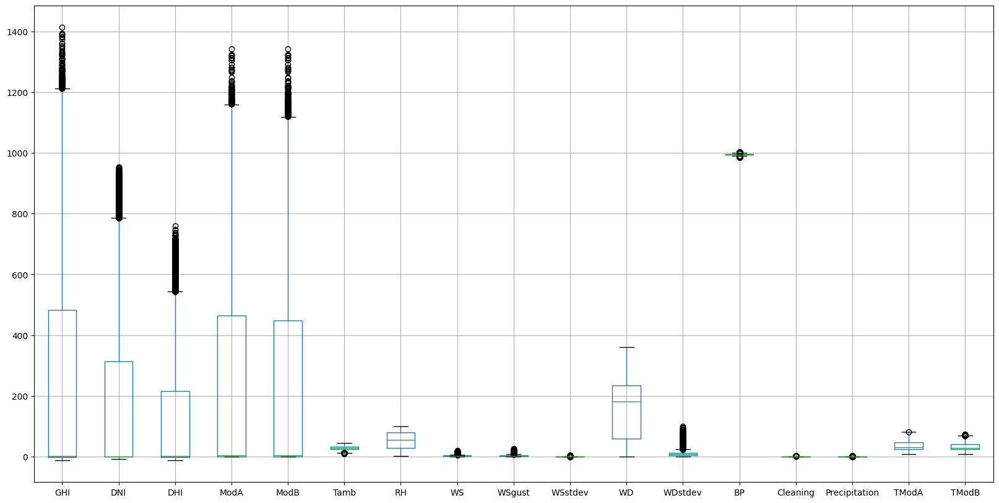

In [69]:
benin_df.boxplot(figsize=(20, 10))
plt.show()

In each box plot, the box represents the interquartile range (the span between the 25th and 75th percentiles), the line within the box marks the median, and the dots outside the box indicate outliers.

### Replacing Outliers with Median

Replacing outliers with the median is often a good strategy because the median is less influenced by extreme values than the mean. This approach helps retain the overall data distribution while effectively handling outliers.

In [70]:
# Iterate over the columns of the DataFrame & Calculate the IQR (Interquartile Range)
for column in benin_df.columns:
  if column == 'Timestamp':
    continue
  if column == 'Cleaning':
    continue
  Q1 = benin_df[column].quantile(0.25)
  Q3 = benin_df[column].quantile(0.75)
  IQR = Q3 - Q1

  # Define the outlier boundaries
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  # Calculate the median of the column column
  median_ghi = benin_df[column].median()

  # Replace outliers with the median
  benin_df[column] = np.where((benin_df[column] < lower_bound) | (benin_df[column] > upper_bound),
                            median_ghi, benin_df[column])

In [71]:
benin_df.to_csv('../data/benin_clean.csv', index=False)

### Histogram

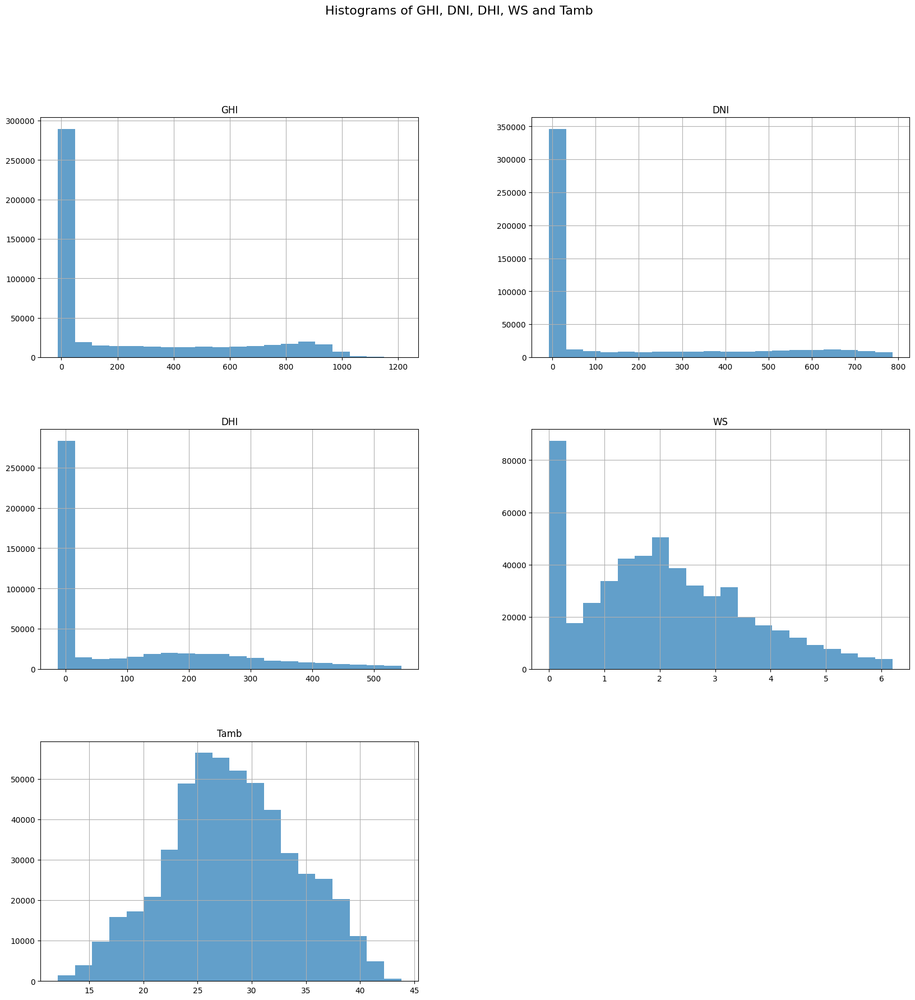

In [72]:
benin_df[["GHI", "DNI", "DHI", "WS", "Tamb"]].hist(figsize=(20, 20), bins=20, alpha=0.7)
plt.suptitle("Histograms of GHI, DNI, DHI, WS and Tamb ", fontsize=16)
plt.show()

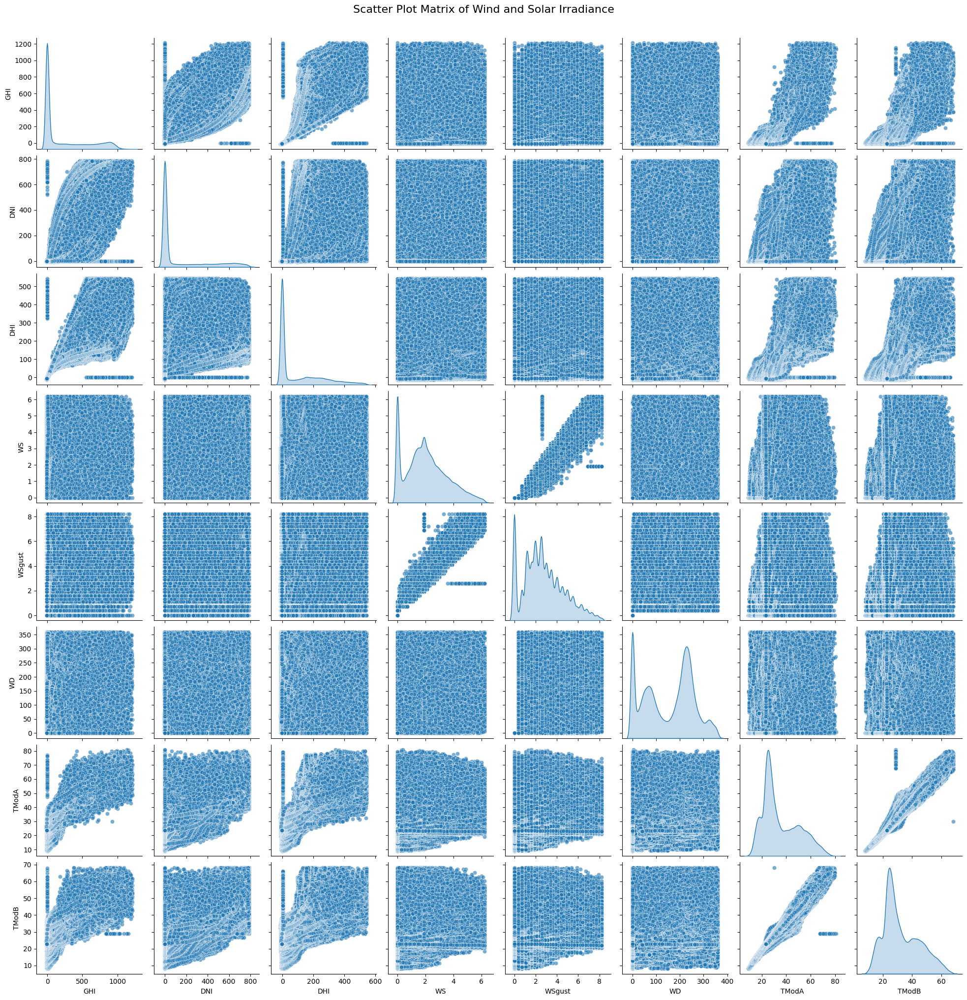

In [73]:
# Subset the data to include wind conditions and solar irradiance
subset_df = benin_df[["GHI", "DNI", "DHI", "WS", "WSgust", "WD", "TModA", "TModB"]]

# Generate a scatter plot matrix
sns.pairplot(subset_df, diag_kind="kde", plot_kws={'alpha': 0.6})
plt.suptitle("Scatter Plot Matrix of Wind and Solar Irradiance", y=1.02, fontsize=16)
plt.show()

### Time Series Visualization of Solar Irradiance and Ambient Temperature in Benin

c:\Users\Surafel Destaw\Documents\KifyaProjects\Solar_Farm_DA\venv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


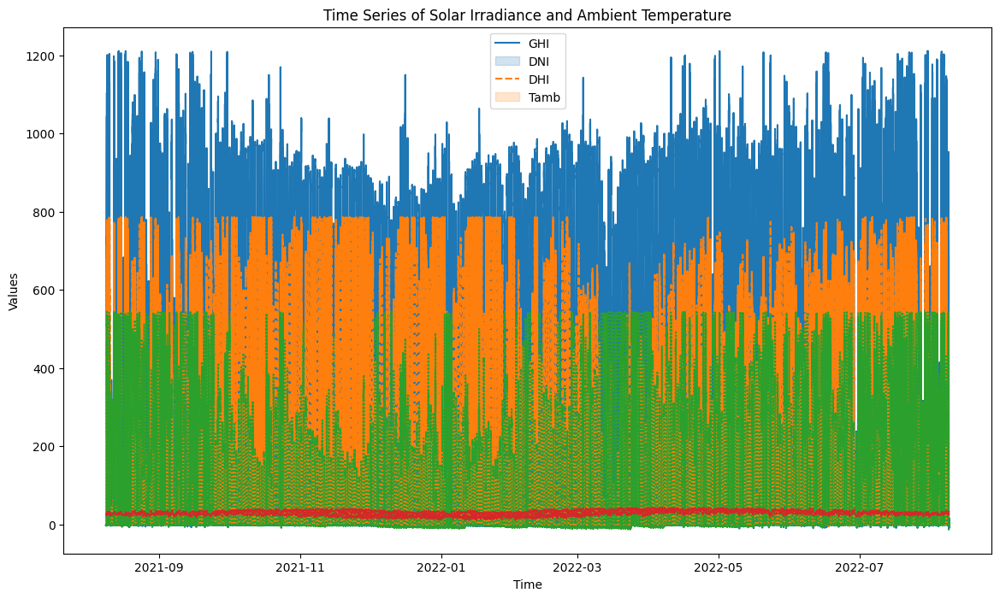

In [74]:
# Ensure 'Timestamp' is in datetime format
benin_df['Timestamp'] = pd.to_datetime(benin_df['Timestamp'])

# Set 'Timestamp' as the index
benin_df.set_index('Timestamp', inplace=True)

# Plot GHI, DNI, DHI, and Tamb over time
plt.figure(figsize=(14, 8))
sns.lineplot(data=benin_df[['GHI', 'DNI', 'DHI', 'Tamb']])
plt.title('Time Series of Solar Irradiance and Ambient Temperature')
plt.xlabel('Time')
plt.ylabel('Values')
plt.legend(['GHI', 'DNI', 'DHI', 'Tamb'])
plt.show()

c:\Users\Surafel Destaw\Documents\KifyaProjects\Solar_Farm_DA\venv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


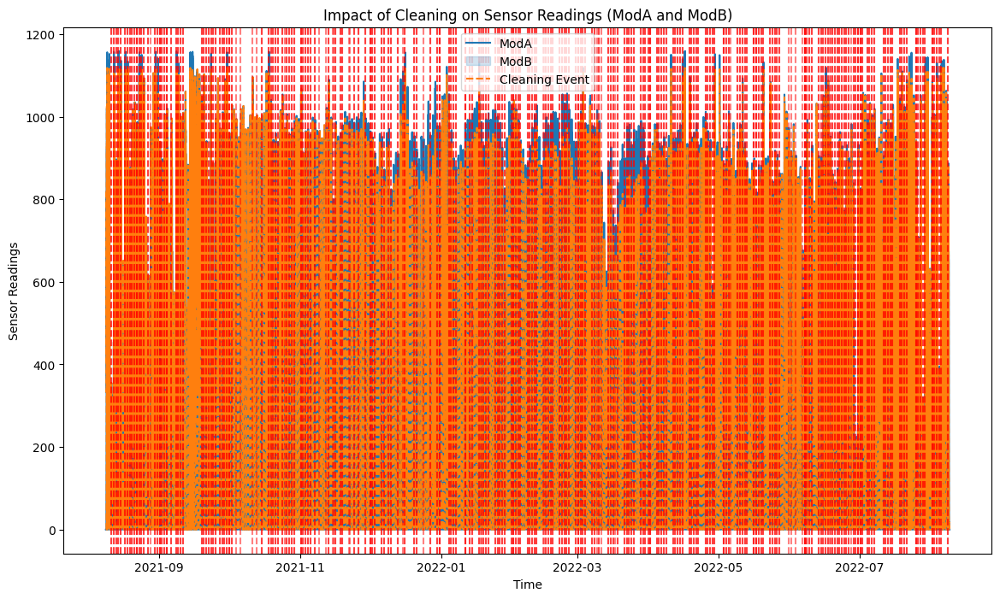

In [75]:
# Plot ModA and ModB over time with cleaning events highlighted
plt.figure(figsize=(14, 8))

# Plot ModA and ModB
sns.lineplot(data=benin_df[['ModA', 'ModB']], palette='tab10')

# Highlight cleaning events
cleaning_events = benin_df[benin_df['Cleaning'] == 1].index
for event in cleaning_events:
    plt.axvline(x=event, color='red', linestyle='--', alpha=0.5)

plt.title('Impact of Cleaning on Sensor Readings (ModA and ModB)')
plt.xlabel('Time')
plt.ylabel('Sensor Readings')
plt.legend(['ModA', 'ModB', 'Cleaning Event'])
plt.show()

### Wind Direction Distribution(Polar Histogram)

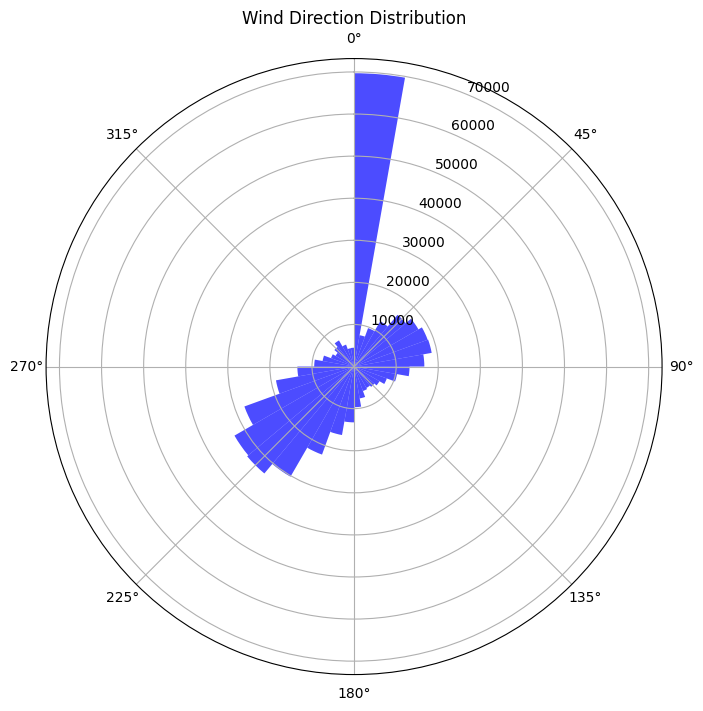

In [76]:
# Convert wind direction from degrees to radians
benin_df['WD_rad'] = np.deg2rad(benin_df['WD'])

# Create a polar histogram for wind direction
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)
ax.hist(benin_df['WD_rad'], bins=36, color='blue', alpha=0.7)
ax.set_theta_zero_location('N')  # Set the start to North
ax.set_theta_direction(-1)  # Set the direction clockwise

plt.title('Wind Direction Distribution')
plt.show()

### Wind Speed vs. Wind Direction(Polar Scatter Plot)

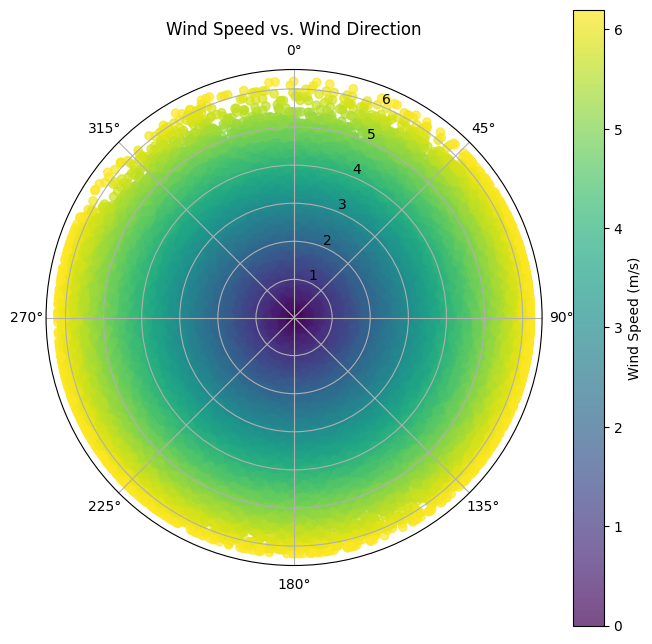

In [77]:
# Create a polar scatter plot for wind speed and direction
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)
sc = ax.scatter(benin_df['WD_rad'], benin_df['WS'], c=benin_df['WS'], cmap='viridis', alpha=0.7)
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)

# Add color bar for wind speed
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Wind Speed (m/s)')

plt.title('Wind Speed vs. Wind Direction')
plt.show()

### Wind Direction Variability

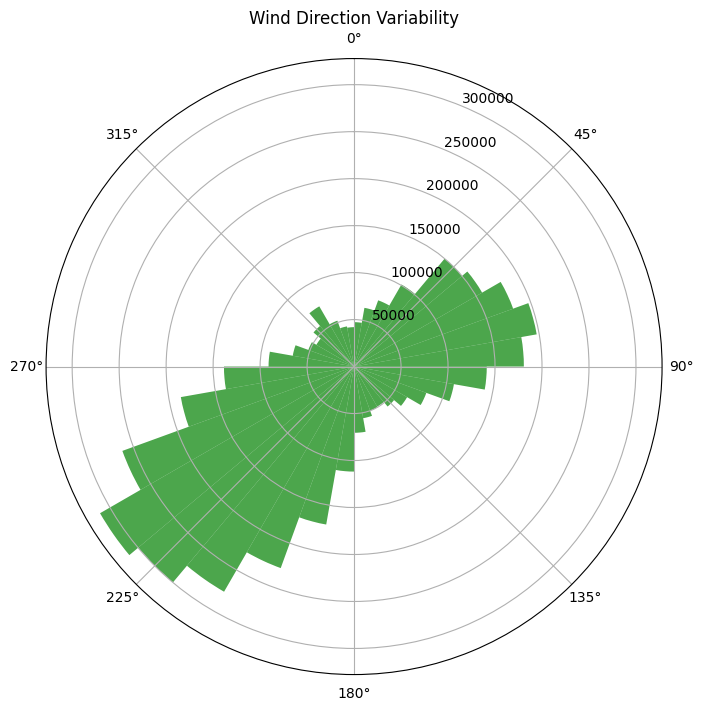

In [78]:

# Convert the standard deviation of wind direction to radians
benin_df['WDstdev_rad'] = np.deg2rad(benin_df['WDstdev'])

# Create a polar plot for wind direction variability
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)
ax.hist(benin_df['WD_rad'], weights=benin_df['WDstdev'], bins=36, color='green', alpha=0.7)
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)

plt.title('Wind Direction Variability')
plt.show()

### The Influence of RH on Temperature and Solar Radiation

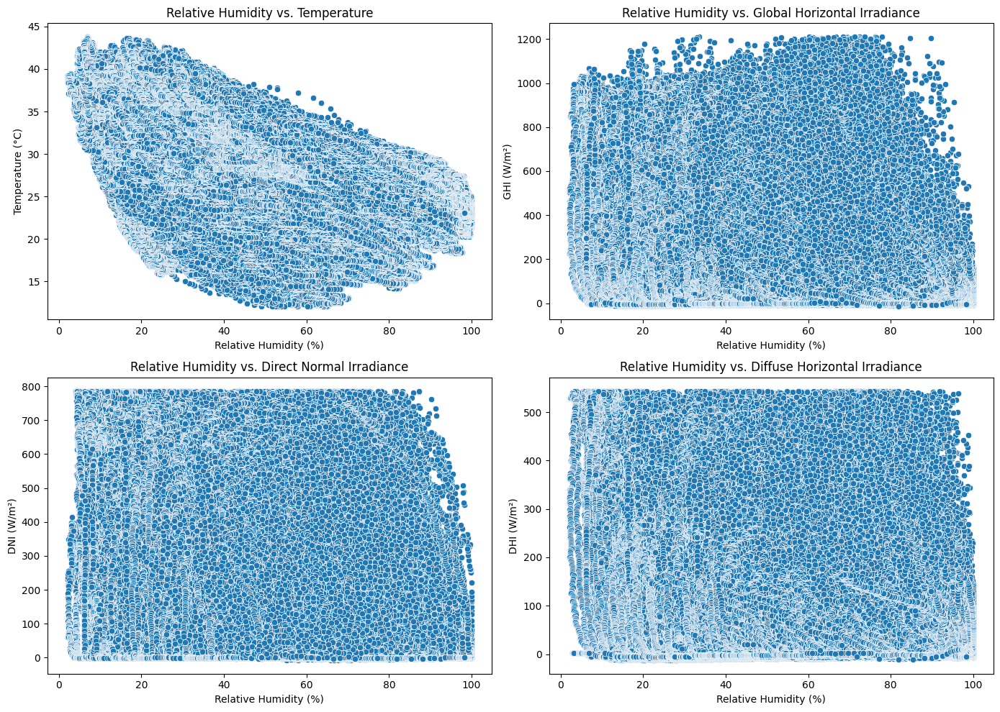

In [79]:
# Set up the figure and axes for multiple scatter plots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Scatter plot for RH vs. Temperature (Tamb)
sns.scatterplot(x='RH', y='Tamb', data=benin_df, ax=axs[0, 0])
axs[0, 0].set_title('Relative Humidity vs. Temperature')
axs[0, 0].set_xlabel('Relative Humidity (%)')
axs[0, 0].set_ylabel('Temperature (°C)')

# Scatter plot for RH vs. Global Horizontal Irradiance (GHI)
sns.scatterplot(x='RH', y='GHI', data=benin_df, ax=axs[0, 1])
axs[0, 1].set_title('Relative Humidity vs. Global Horizontal Irradiance')
axs[0, 1].set_xlabel('Relative Humidity (%)')
axs[0, 1].set_ylabel('GHI (W/m²)')

# Scatter plot for RH vs. Direct Normal Irradiance (DNI)
sns.scatterplot(x='RH', y='DNI', data=benin_df, ax=axs[1, 0])
axs[1, 0].set_title('Relative Humidity vs. Direct Normal Irradiance')
axs[1, 0].set_xlabel('Relative Humidity (%)')
axs[1, 0].set_ylabel('DNI (W/m²)')

# Scatter plot for RH vs. Diffuse Horizontal Irradiance (DHI)
sns.scatterplot(x='RH', y='DHI', data=benin_df, ax=axs[1, 1])
axs[1, 1].set_title('Relative Humidity vs. Diffuse Horizontal Irradiance')
axs[1, 1].set_xlabel('Relative Humidity (%)')
axs[1, 1].set_ylabel('DHI (W/m²)')

# Adjust layout for better spacing
plt.tight_layout()

# Display the plots
plt.show()

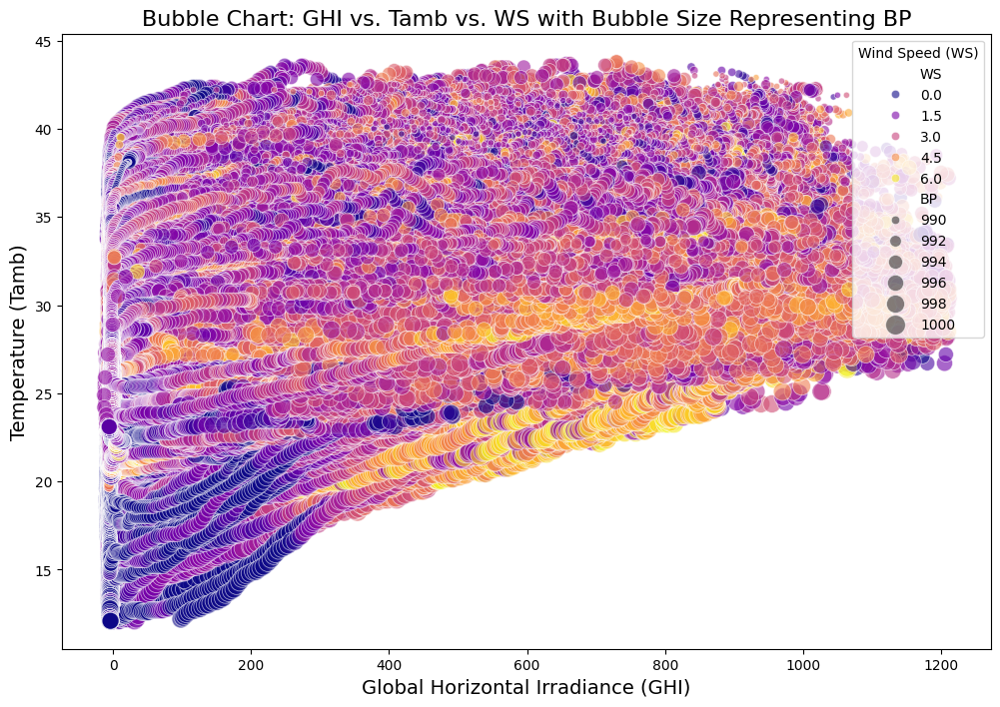

In [80]:
# Create a bubble chart
plt.figure(figsize=(12, 8))

# Scatter plot with bubble size representing BP
bubble_chart = sns.scatterplot(
    x='GHI',
    y='Tamb',
    size='BP',  # Bubble size based on Barometric Pressure (BP)
    hue='WS',   # Color based on Wind Speed (WS)
    sizes=(20, 200),  # Size range for the bubbles
    data=benin_df,
    alpha=0.6,
    palette="plasma"  # Color palette for the wind speed
)

# Set titles and labels
bubble_chart.set_title('Bubble Chart: GHI vs. Tamb vs. WS with Bubble Size Representing BP', fontsize=16)
bubble_chart.set_xlabel('Global Horizontal Irradiance (GHI)', fontsize=14)
bubble_chart.set_ylabel('Temperature (Tamb)', fontsize=14)

# Adjust legend
plt.legend(loc='upper right', title='Wind Speed (WS)')
plt.show()